# Credit Card Users Churn Prediction

## Problem Statement

### Business Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards

### Data Description

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to college student), Post-Graduate, Doctorate
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank (in months)
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

#### What Is a Revolving Balance?

- If we don't pay the balance of the revolving credit account in full every month, the unpaid portion carries over to the next month. That's called a revolving balance


##### What is the Average Open to buy?

- 'Open to Buy' means the amount left on your credit card to use. Now, this column represents the average of this value for the last 12 months.

##### What is the Average utilization Ratio?

- The Avg_Utilization_Ratio represents how much of the available credit the customer spent. This is useful for calculating credit scores.


##### Relation b/w Avg_Open_To_Buy, Credit_Limit and Avg_Utilization_Ratio:

- ( Avg_Open_To_Buy / Credit_Limit ) + Avg_Utilization_Ratio = 1

## Importing necessary libraries

In [1]:
# Import all the necessary libraries
import pandas as pd
import numpy as np
from sklearn import metrics
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import copy

from sklearn.impute import KNNImputer, SimpleImputer

from sklearn.model_selection import train_test_split

from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    ConfusionMatrixDisplay,
    make_scorer,
    confusion_matrix,
)
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier 
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
import xgboost as xgb

from sklearn.model_selection import RandomizedSearchCV
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE


from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

# To ignore unnecessary warnings
import warnings
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings("ignore")
warnings.filterwarnings(action='ignore', category=DataConversionWarning) 
warnings.filterwarnings(action='ignore', category=FutureWarning)

## Loading the dataset

In [2]:
bank_df = pd.read_csv("BankChurners.csv")
pd.set_option('display.max_columns', 80)  # or 1000

## Data Overview

- Observations
- Sanity checks

In [3]:
# Get number of rows and columns
bank_df.shape

(10127, 21)

In [4]:
# Let's take a quick look. 
bank_df.head(20) 

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
5,713061558,Existing Customer,44,M,2,Graduate,Married,$40K - $60K,Blue,36,3,1,2,4010.0,1247,2763.0,1.376,1088,24,0.846,0.311
6,810347208,Existing Customer,51,M,4,NaN,Married,$120K +,Gold,46,6,1,3,34516.0,2264,32252.0,1.975,1330,31,0.722,0.066
7,818906208,Existing Customer,32,M,0,High School,NaN,$60K - $80K,Silver,27,2,2,2,29081.0,1396,27685.0,2.204,1538,36,0.714,0.048
8,710930508,Existing Customer,37,M,3,Uneducated,Single,$60K - $80K,Blue,36,5,2,0,22352.0,2517,19835.0,3.355,1350,24,1.182,0.113
9,719661558,Existing Customer,48,M,2,Graduate,Single,$80K - $120K,Blue,36,6,3,3,11656.0,1677,9979.0,1.524,1441,32,0.882,0.144


In [5]:
bank_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [6]:
# Get some quantitative stats and supress scientific notation
bank_df.describe().T.apply(lambda x: x.apply('{0:.2f}'.format))

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.00,739177606.33,36903783.45,708082083.00,713036770.50,717926358.00,773143533.00,828343083.00
Customer_Age,10127.00,46.33,8.02,26.00,41.00,46.00,52.00,73.00
Dependent_count,10127.00,2.35,1.30,0.00,1.00,2.00,3.00,5.00
Months_on_book,10127.00,35.93,7.99,13.00,31.00,36.00,40.00,56.00
Total_Relationship_Count,10127.00,3.81,1.55,1.00,3.00,4.00,5.00,6.00
Months_Inactive_12_mon,10127.00,2.34,1.01,0.00,2.00,2.00,3.00,6.00
Contacts_Count_12_mon,10127.00,2.46,1.11,0.00,2.00,2.00,3.00,6.00
Credit_Limit,10127.00,8631.95,9088.78,1438.30,2555.00,4549.00,11067.50,34516.00
Total_Revolving_Bal,10127.00,1162.81,814.99,0.00,359.00,1276.00,1784.00,2517.00
Avg_Open_To_Buy,10127.00,7469.14,9090.69,3.00,1324.50,3474.00,9859.00,34516.00


In [7]:
# Check for duplicates -> No duplicates
bank_df.duplicated().value_counts()

False    10127
dtype: int64

In [8]:
# Where do I have nulls or missing values
bank_df.isna().sum(axis = 0)

CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

In [9]:
bank_df['Attrition_Flag'].value_counts(normalize=True)

Existing Customer    0.83934
Attrited Customer    0.16066
Name: Attrition_Flag, dtype: float64

In [10]:
bank_df['Gender'].value_counts(normalize=True)

F    0.529081
M    0.470919
Name: Gender, dtype: float64

In [11]:
bank_df['Education_Level'].value_counts(normalize=True)

Graduate         0.363383
High School      0.233852
Uneducated       0.172746
College          0.117681
Post-Graduate    0.059944
Doctorate        0.052393
Name: Education_Level, dtype: float64

In [12]:
bank_df['Marital_Status'].value_counts(normalize=True)

Married     0.499787
Single      0.420452
Divorced    0.079761
Name: Marital_Status, dtype: float64

In [13]:
bank_df['Income_Category'].value_counts(normalize=True)

Less than $40K    0.351634
$40K - $60K       0.176755
$80K - $120K      0.151575
$60K - $80K       0.138442
abc               0.109805
$120K +           0.071788
Name: Income_Category, dtype: float64

In [14]:
bank_df['Card_Category'].value_counts(normalize=True)

Blue        0.931767
Silver      0.054804
Gold        0.011455
Platinum    0.001975
Name: Card_Category, dtype: float64

### Observations
* 84% of the customers are Existing vs 16% Attrited.
* `Age` look reasonable in their range (26-73) with a mean of 46
* `Gender` percentages are close (53% Female vs 47% Male).
* No super big families, 5 dependents is the max.  Some with no dependents.
* Nulls exist, but over 50% of customers have college or high school degrees. Only about 11% of the customers have a Post-Graduate or Doctorate degree.  College students make up 12% of the customer base.
* Three types of `Marital_Status`: Married (50%), Single (42%), Divorced (8%).  Missing some values though.
* Ranges of Income, but a strange value of 'abc'that makes up about 11% of the data.  **Will need to address.** ✅
* Most customers have Blue `Card_Category` (93%).  The three other categories are less than 7%, Platinum is < 1%.
* `Months_on_book` looks reasonable in their range (13-56 months) with a mean of 36 months
* `Total_Relationship_Count` looks reasonable in the range of 1-6 with the mean of ~4 products.  Is it important to know what those products are?
* `Months_Inactive_12_mon` looks reasonable in the range of 0-6 months with mean of ~2 months.
* `Contacts_Count_12_mon` looks reasonable in the range of 0-6 months with mean of ~2.5 months.
* `Credit_Limit` looks reasonable in the range of \\$1400-\\$34,000 with mean of ~\\$8,600.  **Need to look at distribution** ✅
* `Total_Revolving_Bal` are relatively small with max ~\\$2500.
* `Avg_Open_To_Buy` max should not be bigger than max credit limit and it isn't.  Interesting that `Credit Limit` max == `Avg_Open_To_Buy` max.  This means the individual(s) with the max credit limit don't actually use their credit card.  
* `Total_Amt_Chng_Q4_Q1` - Assume this is a ratio of some sorts where Q4/Q1 so values should be more and less than one, but not negative.  That is the case. I guess the case for when Q1 is zero is simply handled as 0.0.
* `Total_Trans_Amt` ranges from \\$500 to \\$18000. **Need to look at distribution** ✅
* `Total_Trans_Ct` ranges from 10-139 with a mean of ~65 transactions. **Need to look at distribution** ✅
* `Total_Ct_Chng_Q4_Q1` - Assume this is a ratio of some sorts where Q4/Q1 so values should be more and less than one, but not negative.  That is the case. I guess the case for when Q1 is zero is simply handled as 0.0.
* `Avg_Utilization_Ratio` has no values greater than 1. **Need to look at distribution** ✅
* `Education_Level` and `Marital_Status` are the only variables **with missing values.** ✅

## Exploratory Data Analysis (EDA)

#### The below functions need to be defined to carry out the Exploratory Data Analysis.

In [15]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [16]:
# function to plot a two countplots side by side.


def countplot_sbs(df1, df2, feature):
        
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8, 5), sharey=True)

    #target_uniq = data[target].unique()
    total_df1 = len(df1[feature]) - df1[feature].isna().sum(axis = 0) # length of the column
    total_df2 = len(df2[feature])
    
    
    axs[0].set_title("Original Distribution")
    ax1 = sns.countplot(
        data=df1,
        x=feature,
        palette="Paired",
        ax=axs[0],
        #stat='percent'
        order=df1[feature].value_counts().index[:].sort_values(),
    )

    for p in ax1.patches:
        label = "{:.1f}%".format(
                100 * p.get_height() / total_df1
        )  # percentage of each class of the category
        
        #label = p.get_height()  # count of each level of the category
        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax1.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=8,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentagehe percentage
    
    
    axs[1].set_title("Imputed Distribution")
    ax2 = sns.countplot(
        data=df2,
        x=feature,
        palette="Paired",
        ax=axs[1],
        #stat='percent'
        order=df2[feature].value_counts().index[:].sort_values(),
    )
    
    for p in ax2.patches:
        label = "{:.1f}%".format(
               100 * p.get_height() / total_df2
        )  # percentage of each class of the category
        #label = p.get_height()  # count of each level of the category
        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax2.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=8,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentagehe percentage
    
    plt.tight_layout()
    plt.setp(ax1.get_xticklabels() + ax2.get_xticklabels(), rotation=30, ha='right')
    plt.show()
    
    
    

In [17]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [18]:
# function to plot stacked bar chart

def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

In [19]:
### Function to plot distributions

def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

#### Exploratory Data Analysis Instructions.

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

#### Questions

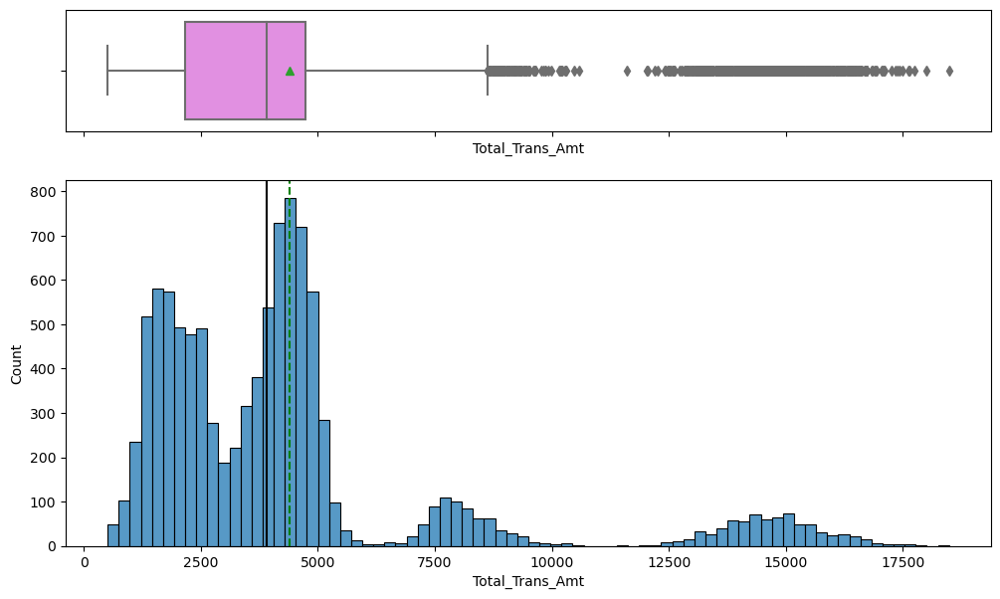

In [20]:
# 1. How is the total transaction amount distributed? 
histogram_boxplot(bank_df, 'Total_Trans_Amt')

**Ans: U-shaped distribution that is right-skewed with many outliers.**

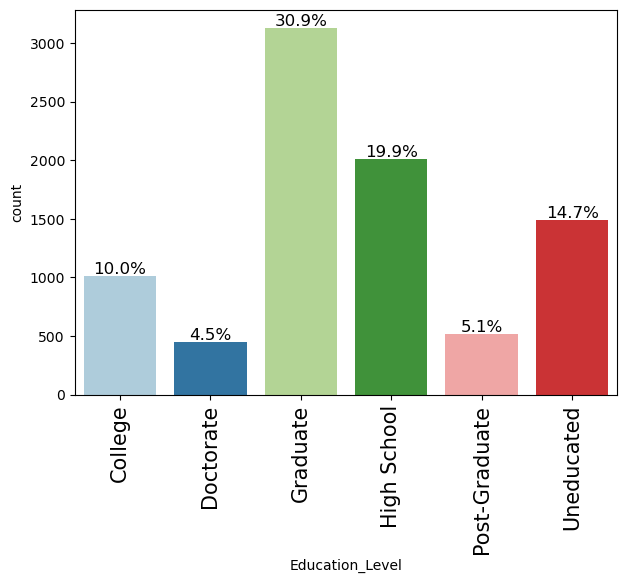

In [21]:
# 2. What is the distribution of the level of education of customers?
labeled_barplot(bank_df, 'Education_Level', perc=True)

**Ans: Like I said above, Nulls exist, but over 50% of customers have college or high school degrees. Only about 11% of the customers have a Post-Graduate or Doctorate degree. College students make up 12% of the customer base.**

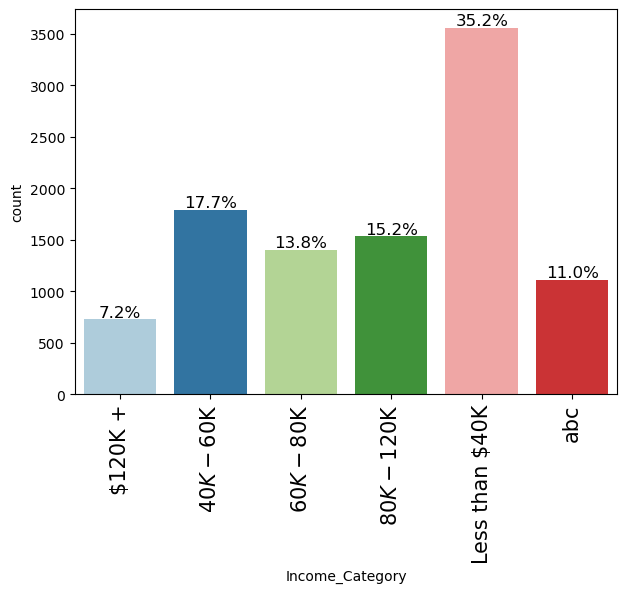

In [22]:
# 3. What is the distribution of the level of income of customers?
labeled_barplot(bank_df, 'Income_Category', perc=True)

**Ans: The real distribution is difficult to determine because of the 'abc' category in the data.  However, if we just use the data in the graph, must customers make less than \\$40K. The other catogories are close with over $120K noticably smaller.**

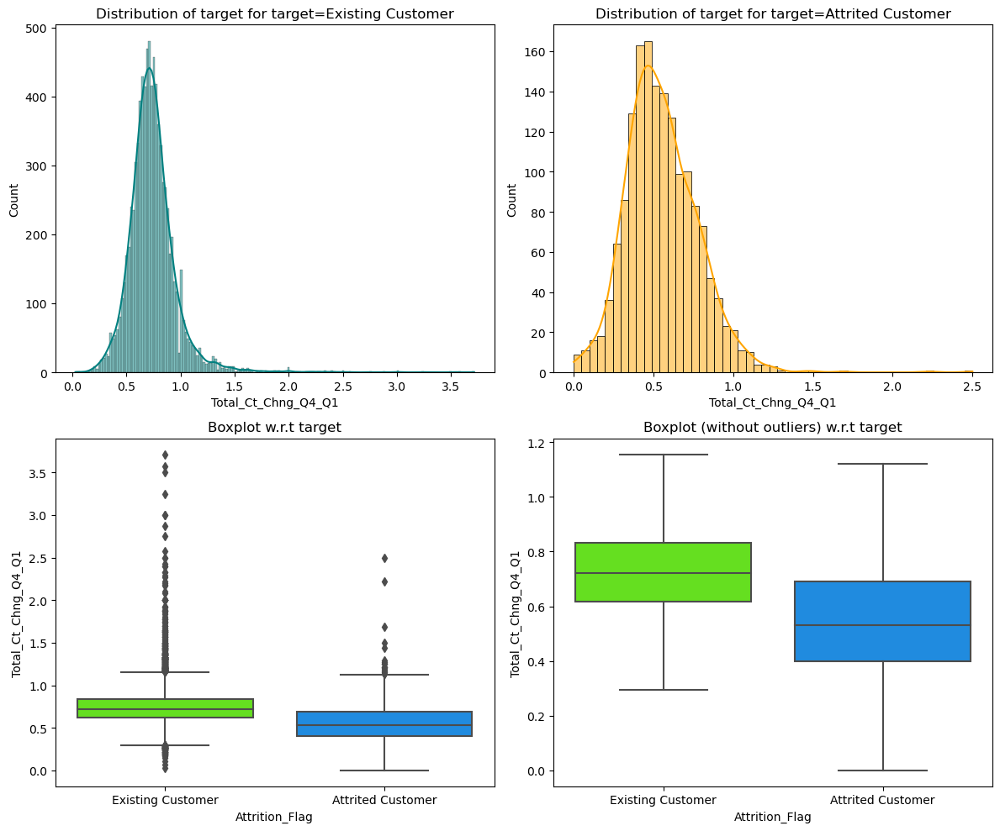

In [23]:
# 4. How does the change in transaction amount between Q4 and Q1 (`total_ct_change_Q4_Q1`) vary 
# by the customer's account status (`Attrition_Flag`)?
distribution_plot_wrt_target(bank_df, "Total_Ct_Chng_Q4_Q1", "Attrition_Flag")

**Ans: `Total_Ct_Chng_Q4_Q1` in general is smaller for Attrited Customers. Existing customers have more outliers (though it also has many more data points).**

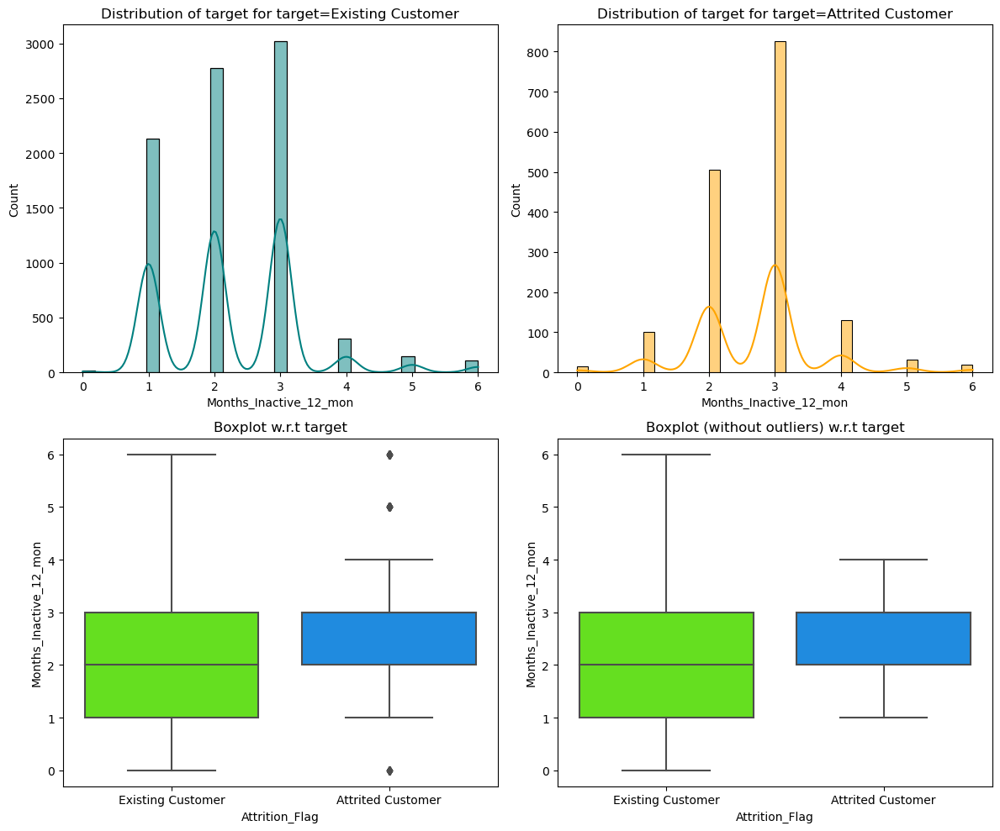

In [24]:
# 5. How does the number of months a customer was inactive in the last 12 months 
# (`Months_Inactive_12_mon`) vary by the customer's account status (`Attrition_Flag`)?
distribution_plot_wrt_target(bank_df, "Months_Inactive_12_mon", "Attrition_Flag")

**Ans: Most attrited customers go 2-3 months without using their card in 12 months where as existing customers go 1-3 months. This seems to confirm the idea that customers who use their cards stay customers).**

In [25]:
# 6. What are the attributes that have a strong correlation with each other?
bank_df.corr().apply(lambda x: x.apply('{0:.2f}'.format))

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
CLIENTNUM,1.00,0.01,0.01,0.13,0.01,0.01,0.01,0.01,0.00,0.01,0.02,-0.02,-0.00,0.01,0.00
Customer_Age,0.01,1.00,-0.12,0.79,-0.01,0.05,-0.02,0.00,0.01,0.00,-0.06,-0.05,-0.07,-0.01,0.01
Dependent_count,0.01,-0.12,1.00,-0.10,-0.04,-0.01,-0.04,0.07,-0.00,0.07,-0.04,0.03,0.05,0.01,-0.04
Months_on_book,0.13,0.79,-0.10,1.00,-0.01,0.07,-0.01,0.01,0.01,0.01,-0.05,-0.04,-0.05,-0.01,-0.01
Total_Relationship_Count,0.01,-0.01,-0.04,-0.01,1.00,-0.00,0.06,-0.07,0.01,-0.07,0.05,-0.35,-0.24,0.04,0.07
Months_Inactive_12_mon,0.01,0.05,-0.01,0.07,-0.00,1.00,0.03,-0.02,-0.04,-0.02,-0.03,-0.04,-0.04,-0.04,-0.01
Contacts_Count_12_mon,0.01,-0.02,-0.04,-0.01,0.06,0.03,1.00,0.02,-0.05,0.03,-0.02,-0.11,-0.15,-0.09,-0.06
Credit_Limit,0.01,0.00,0.07,0.01,-0.07,-0.02,0.02,1.00,0.04,1.00,0.01,0.17,0.08,-0.00,-0.48
Total_Revolving_Bal,0.00,0.01,-0.00,0.01,0.01,-0.04,-0.05,0.04,1.00,-0.05,0.06,0.06,0.06,0.09,0.62
Avg_Open_To_Buy,0.01,0.00,0.07,0.01,-0.07,-0.02,0.03,1.00,-0.05,1.00,0.01,0.17,0.07,-0.01,-0.54


**Ans:**
* **'Months_on_book' and 'Customer_Age'(.79),**
* **'Average_Utilization' and 'Total_Revolving_Bal' (.62),**
* **'Total_Trans_Amt' and 'Total_Trans_Ct' (.81)**

#### Additional EDA

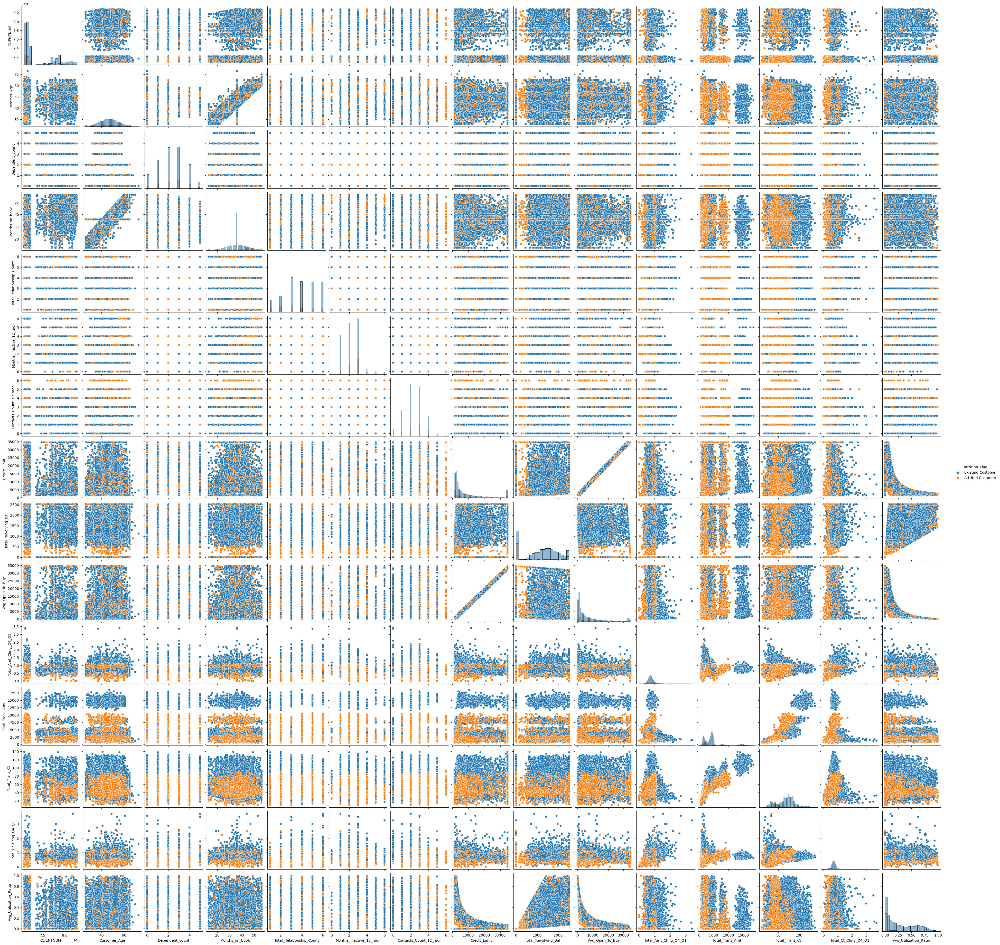

In [26]:
sns.pairplot(bank_df, hue = 'Attrition_Flag' , diag_kind='hist')

**Observations:**
* **'Total_Trans_Amt' and 'Total_Trans_Ct' very much have a boundary where Attrited individuals do not venture**
* **'Total_Revolving_Bal' also seems to have some separation for lower Attrited individuals**

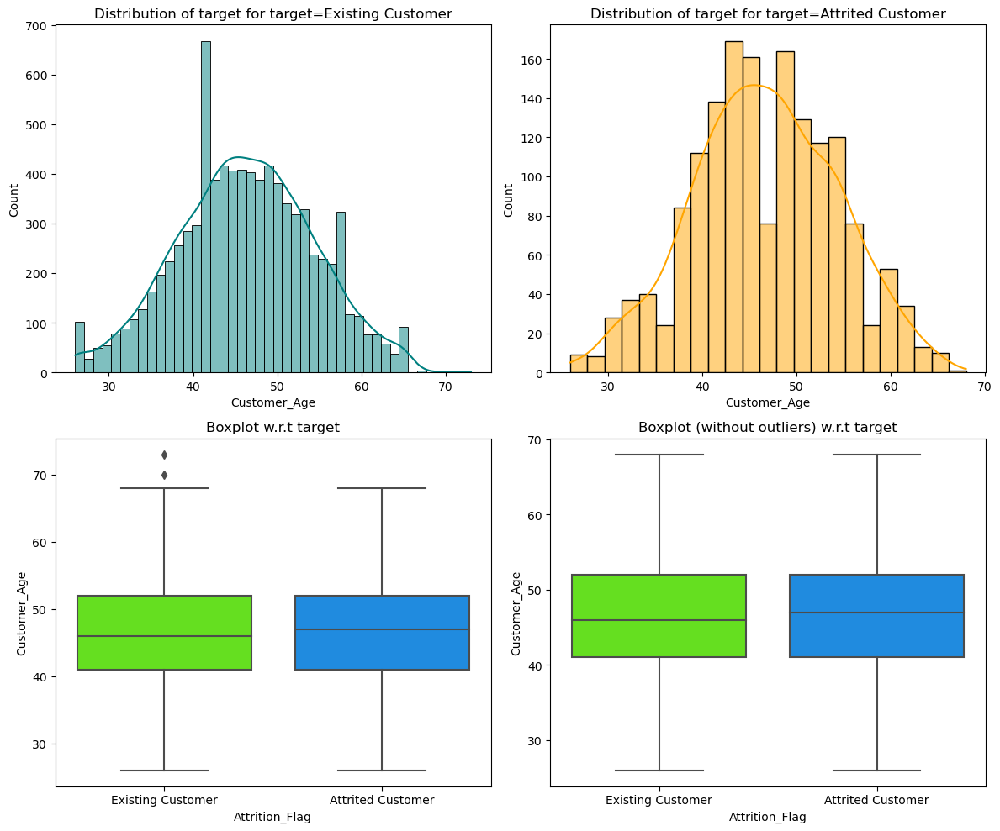

In [27]:
# Check out how 'Customer Age' varies with 'Attribution_Flag'
distribution_plot_wrt_target(bank_df, "Customer_Age", "Attrition_Flag")

**Distributions look similar.  Of course the ratio of Existing to Attrited is rather large 
so count values are less important.  Interesting spikes and valleys in the graphs.**

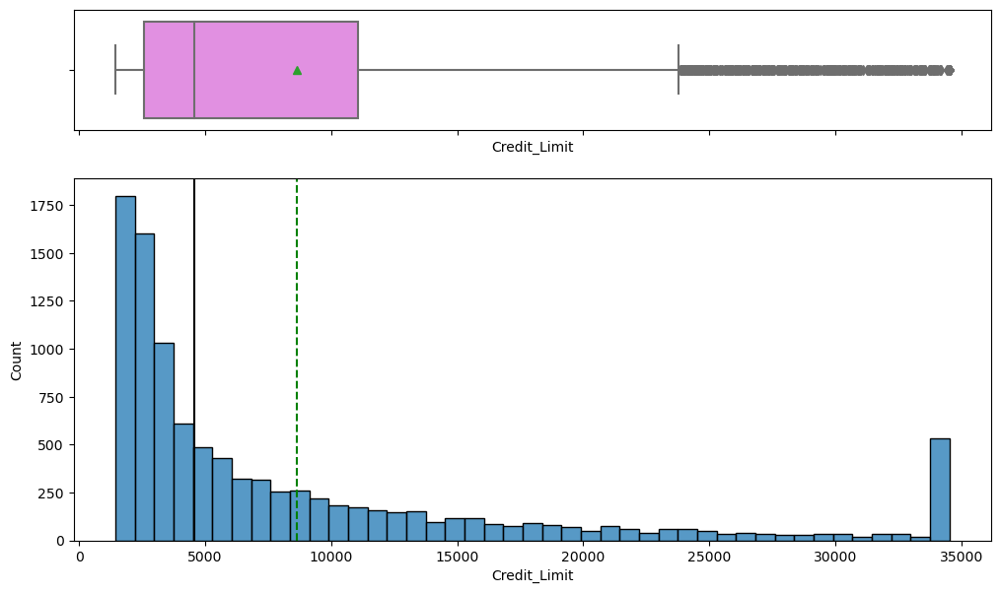

In [28]:
# Look at distribution of Credit Limit
# There are over 500 customers with what seems like a max credit limit.  
histogram_boxplot(bank_df, 'Credit_Limit')

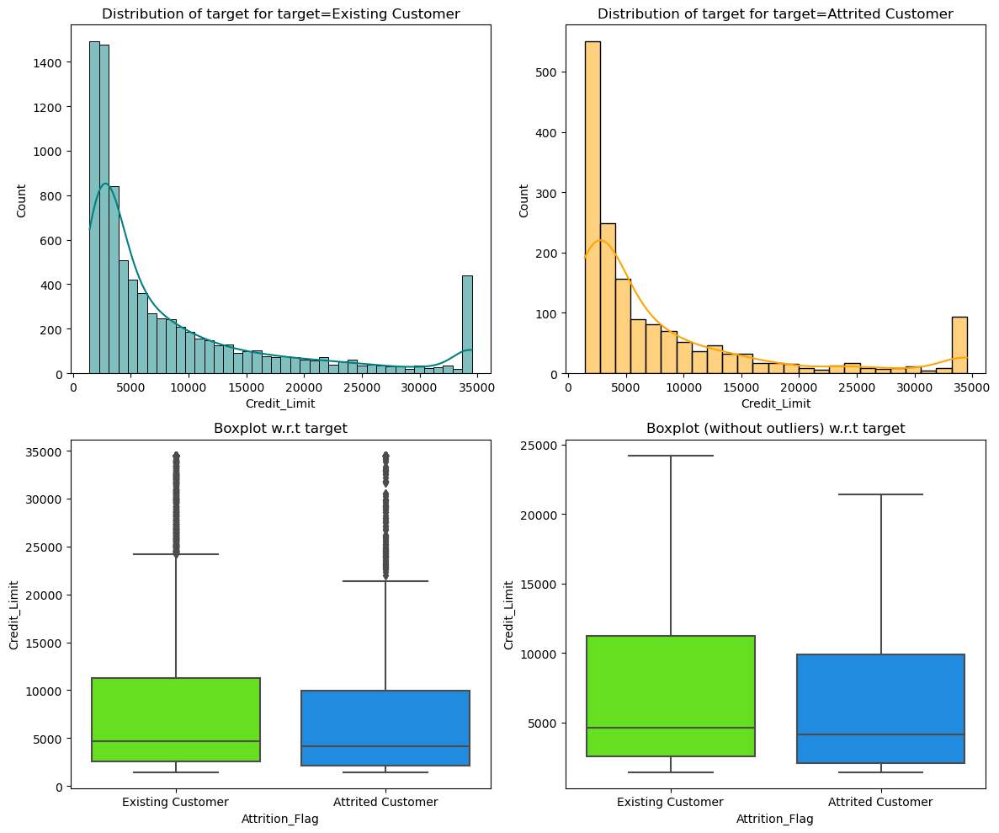

In [29]:
# Check out how 'Credit_Limit' varies with 'Attribution_Flag'
distribution_plot_wrt_target(bank_df, "Credit_Limit", "Attrition_Flag")

**Again, distributions look similar.  Notice the spike at the max is present in both 'Attribution_Flag' categories.  Lots of outliers for both categories.**

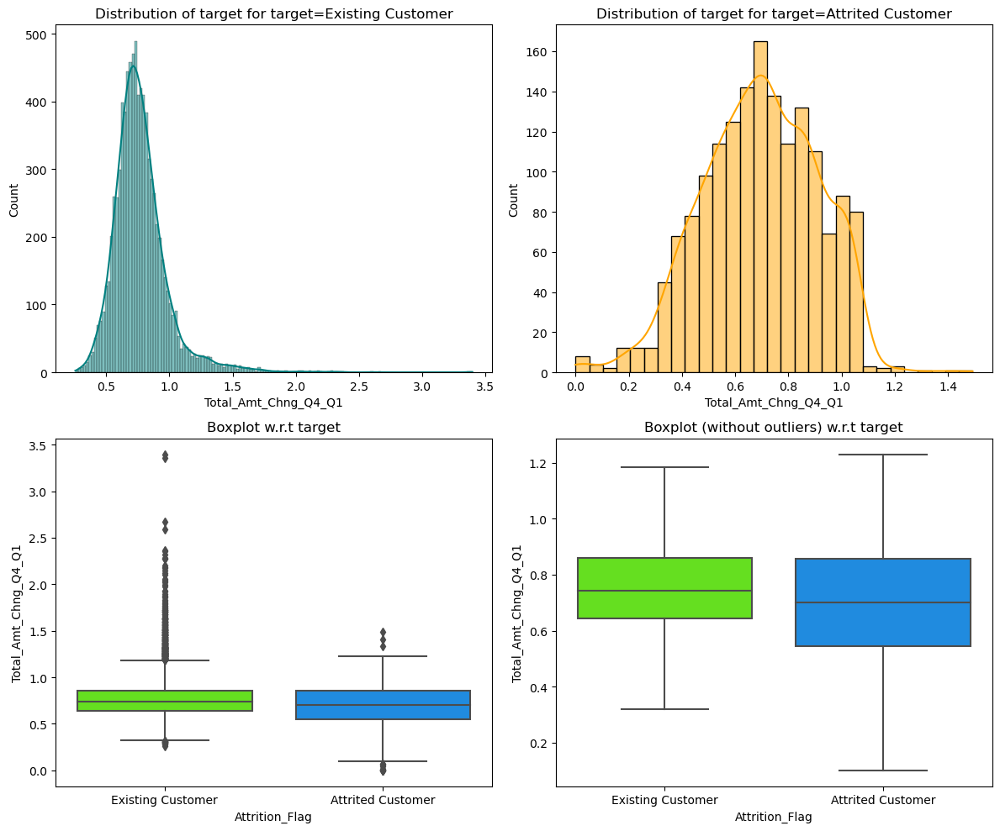

In [30]:
distribution_plot_wrt_target(bank_df, "Total_Amt_Chng_Q4_Q1", "Attrition_Flag")

**Normal distribution for both categories.  Once again pretty good alignment around the medians and quartiles.**

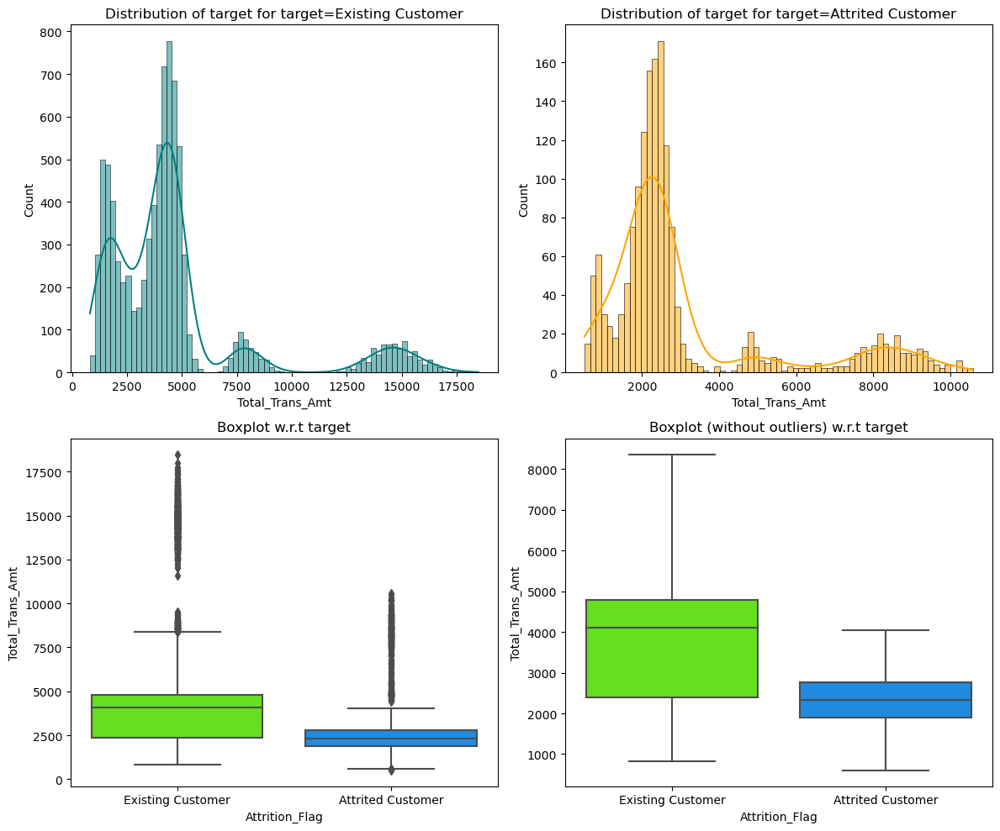

In [31]:
distribution_plot_wrt_target(bank_df, "Total_Trans_Amt", "Attrition_Flag")

**Similar u-shaped histograms for both categories.  This time their isn't the alignment for the quartiles like we've seen.**

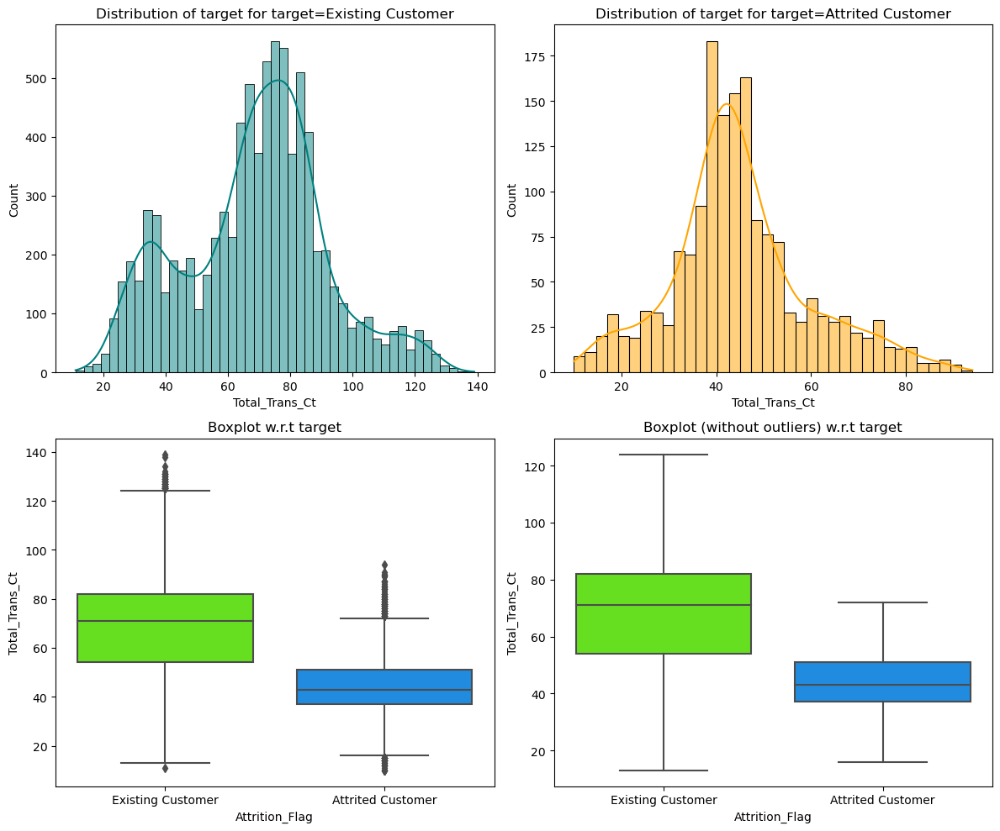

In [32]:
distribution_plot_wrt_target(bank_df, "Total_Trans_Ct", "Attrition_Flag")

**U-shaped distribution for Existing, but not for Attrited.  Again, their isn't the alignment for the quartiles like we've seen.**

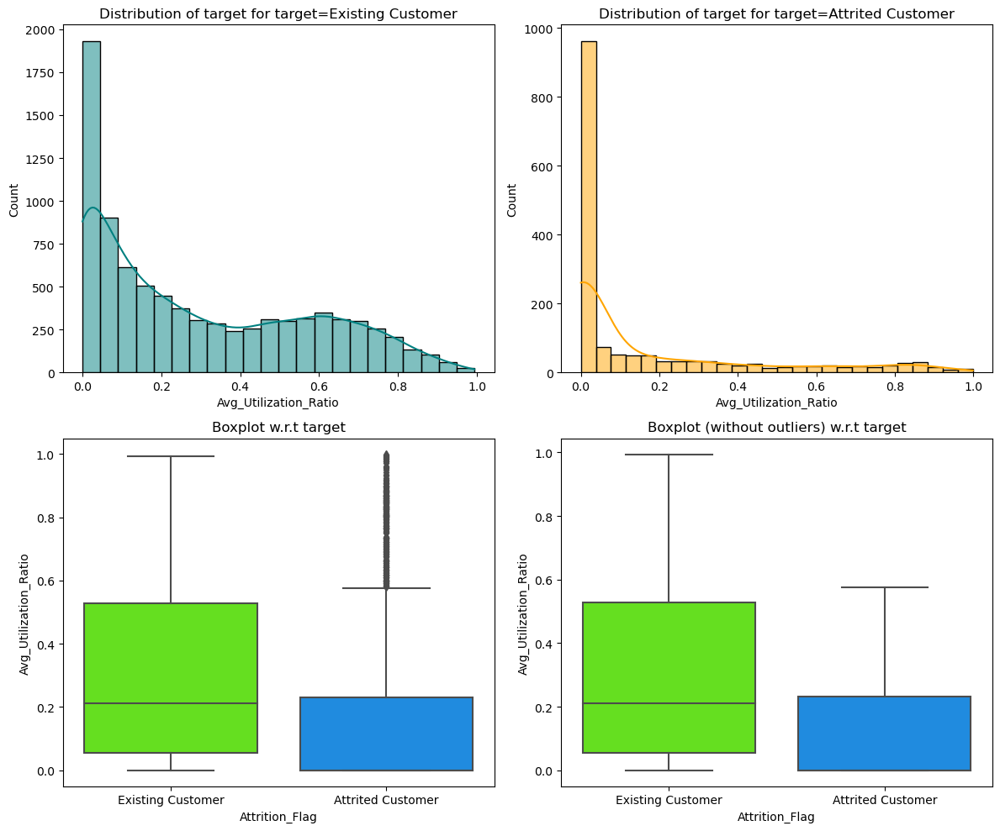

In [33]:
distribution_plot_wrt_target(bank_df, "Avg_Utilization_Ratio", "Attrition_Flag")

**Similar distributions with Existing being more gradual.  Big decline for Attrited when ration gets even slightly away from 0.0.  Again, their isn't the alignment for the quartiles like we've seen. Lots of Attrited don't appear to use their cards**

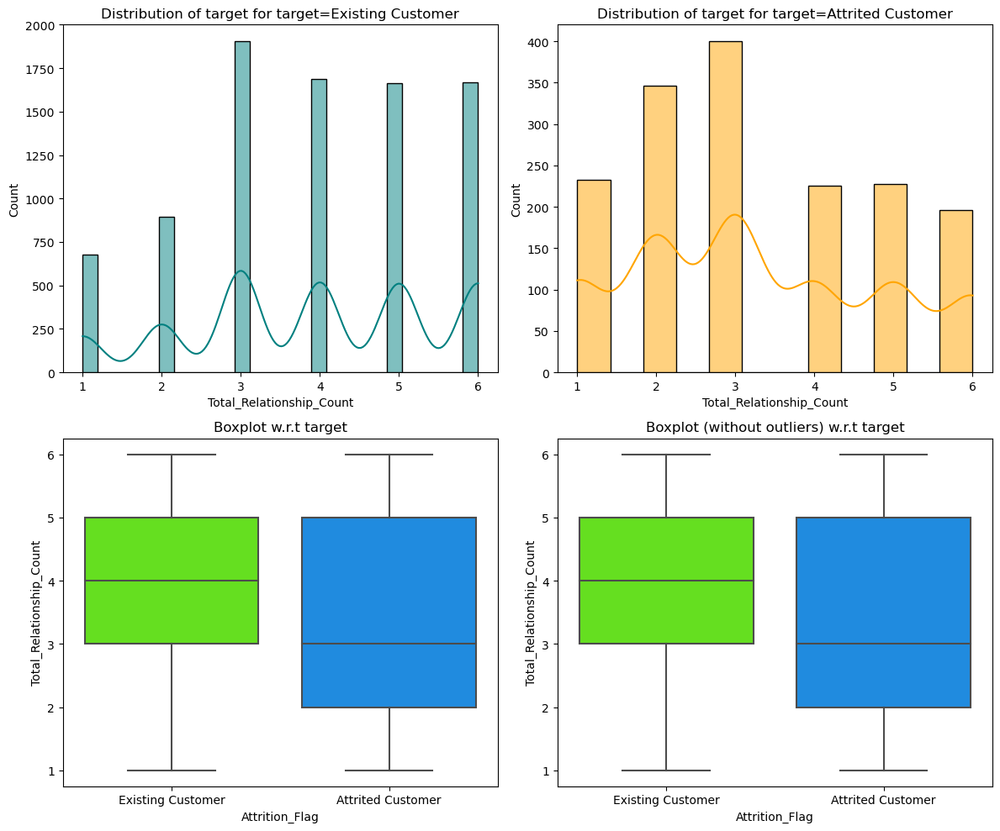

In [34]:
distribution_plot_wrt_target(bank_df, "Total_Relationship_Count", "Attrition_Flag")

**Attrited have less number of products.  Customers who don't leave have many products.**

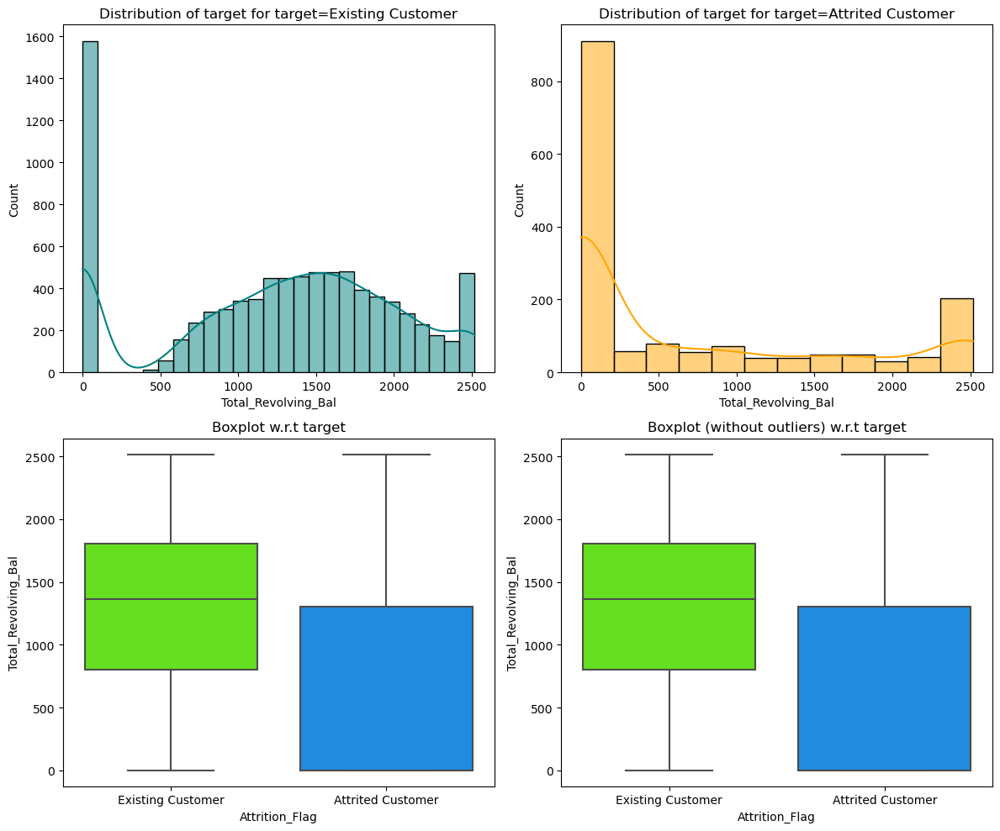

In [35]:
distribution_plot_wrt_target(bank_df, "Total_Revolving_Bal", "Attrition_Flag")

**Attrited customers keep their balances down (if they have a balance that revolves).**  

## Data Pre-processing

**Let's check and see if the data is clean per the the formula mentioned above.**

In [36]:
# Evaluation must take into account float values.
bank_df[(bank_df['Avg_Open_To_Buy'] / bank_df['Credit_Limit'] + bank_df['Avg_Utilization_Ratio'] < .99) & 
        (bank_df['Avg_Open_To_Buy'] / bank_df['Credit_Limit'] + bank_df['Avg_Utilization_Ratio']) > 1.00009].shape

(0, 21)

**Formula seems to hold for the data.**

**Fix `Attrition_Flag`.**

In [37]:
new_label = {'Attrition_Flag': {'Attrited Customer': 1, 'Existing Customer': 0}}
bank_df.replace(new_label, inplace=True)
bank_df['Attrition_Flag'].value_counts()

0    8500
1    1627
Name: Attrition_Flag, dtype: int64

**Fix `Gender`. 0 for female and 1 for male.**

In [38]:
new_label = {'Gender': {'M': 1, 'F': 0}}
bank_df.replace(new_label, inplace=True)

**Drop `CLIENTNUM`. It is unnecessary.**

In [39]:
bank_df.drop(['CLIENTNUM'], axis=1, inplace=True)

**Create dummy variables with `Card_Category`.**

In [40]:
bank_df = pd.get_dummies(bank_df, columns=['Card_Category'], drop_first=True)

## Missing value imputation and Dataset Creation




**Let's investigate the 'ABC' in the Income Ranges.**

In [41]:
bank_df['Income_Category'].value_counts(normalize=True)

Less than $40K    0.351634
$40K - $60K       0.176755
$80K - $120K      0.151575
$60K - $80K       0.138442
abc               0.109805
$120K +           0.071788
Name: Income_Category, dtype: float64

**Interesting that it seems to count by \\$20K increments, but there is this one \\$80K-\\$120K category.  Could this be some mislabeling happening.  Unfortunately, we don't have any data to validate this intuition.  Thus, we can either replace all the 'abc' values per some strategy or relabel the columns and proceed. I'll do the former.**

In [42]:
# Replace 'abc' with nulls
bank_df['Income_Category'].replace('abc', np.nan, inplace=True)

In [43]:
# One last check
bank_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  int64  
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  int64  
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           8608 non-null   object 
 5   Marital_Status            9378 non-null   object 
 6   Income_Category           9015 non-null   object 
 7   Months_on_book            10127 non-null  int64  
 8   Total_Relationship_Count  10127 non-null  int64  
 9   Months_Inactive_12_mon    10127 non-null  int64  
 10  Contacts_Count_12_mon     10127 non-null  int64  
 11  Credit_Limit              10127 non-null  float64
 12  Total_Revolving_Bal       10127 non-null  int64  
 13  Avg_Open_To_Buy           10127 non-null  float64
 14  Total_

In [44]:
# independant variables
X = bank_df.drop(['Attrition_Flag'], axis=1)

# the dependent variable
y = bank_df[['Attrition_Flag']]

In [45]:
# Splitting data into training, validation and test set:

# first we split data into 2 parts, say temporary and test
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.5, random_state=0, stratify=y
)

# then we split the temporary set into train and validation
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.4, random_state=0, stratify=y_temp
)

print(X_train.shape, X_val.shape, X_test.shape)

(5063, 21) (3038, 21) (2026, 21)


In [46]:
# Before doing any imputations, create a copy so we can review a before and after.
nul_cols = ['Education_Level', 'Marital_Status', 'Income_Category']

In [47]:
# Let's impute the missing values
imp_median = SimpleImputer(missing_values=np.nan, strategy="most_frequent")

# fit the imputer on train data and transform the train data
X_train[nul_cols] = imp_median.fit_transform(X_train[nul_cols])

In [48]:
# transform the validation and test data using the imputer fit using validation and test data only
X_val[nul_cols] = imp_median.transform(X_val[nul_cols])
X_test[nul_cols] = imp_median.transform(X_test[nul_cols])

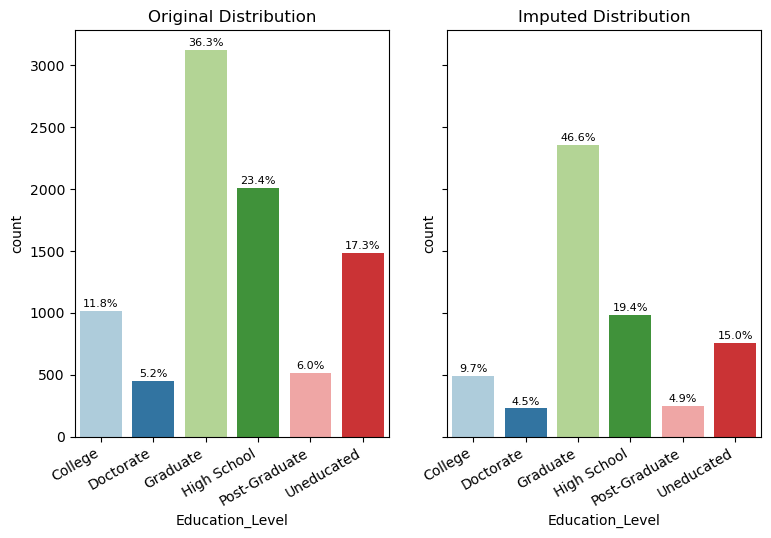

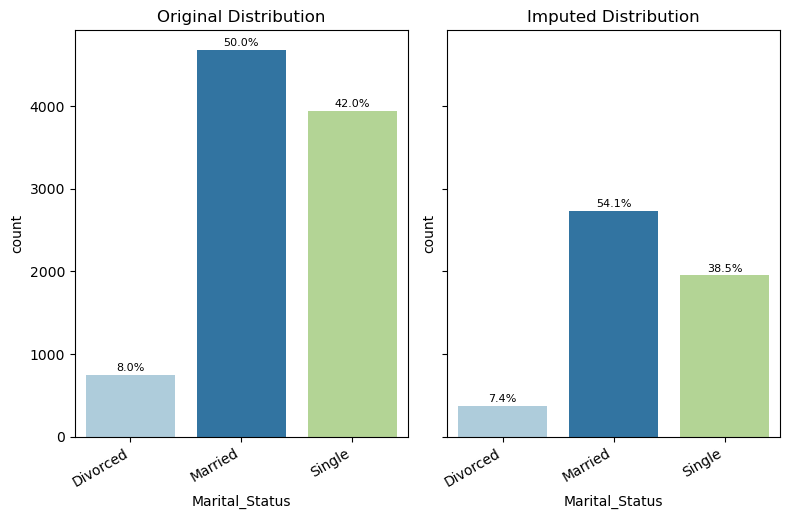

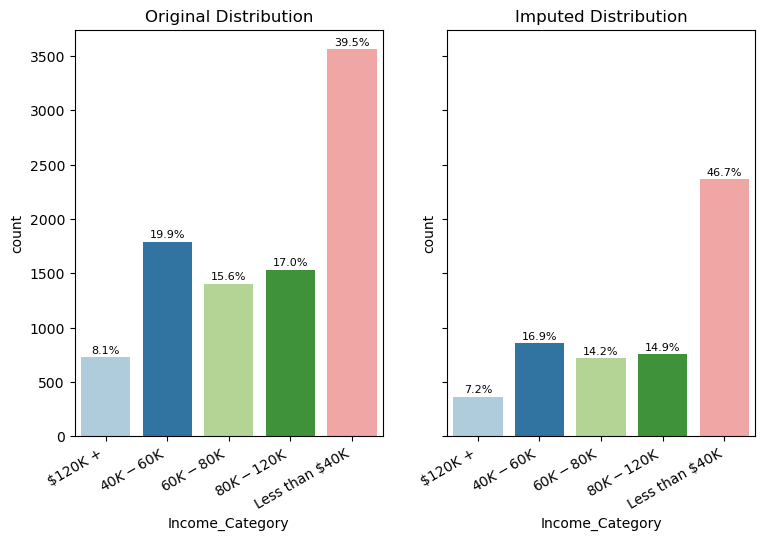

In [49]:
# Compare distributions from original dataset (without counting nulls) and the X_train (imputed)
for item in nul_cols:
    countplot_sbs(bank_df, X_train, item)

**Percentages are different as expected, but the overall shape of the data is correctly mirrored from original dataset to imputed.**

In [50]:
# Create dummy variables for Card Category and the three new imputed columns
X_train = pd.get_dummies(X_train, drop_first=True)
X_val = pd.get_dummies(X_val, drop_first=True)
X_test = pd.get_dummies(X_test, drop_first=True)

In [51]:
# One last check
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5063 entries, 2327 to 5525
Data columns (total 29 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Customer_Age                    5063 non-null   int64  
 1   Gender                          5063 non-null   int64  
 2   Dependent_count                 5063 non-null   int64  
 3   Months_on_book                  5063 non-null   int64  
 4   Total_Relationship_Count        5063 non-null   int64  
 5   Months_Inactive_12_mon          5063 non-null   int64  
 6   Contacts_Count_12_mon           5063 non-null   int64  
 7   Credit_Limit                    5063 non-null   float64
 8   Total_Revolving_Bal             5063 non-null   int64  
 9   Avg_Open_To_Buy                 5063 non-null   float64
 10  Total_Amt_Chng_Q4_Q1            5063 non-null   float64
 11  Total_Trans_Amt                 5063 non-null   int64  
 12  Total_Trans_Ct                 

## Model Building

### Model evaluation criterion

The nature of predictions made by the classification model will translate as follows:

- True positives (TP) are individuals correctly predicted by the model to leave their credit card services 
- False negatives (FN) are individuals who are predicted NOT to leave their credit card services but indeed will leave.
- False positives (FP) are individuals predicted by the model to leave their credit card services but will not.

**Which metric to optimize?**

* We need to choose the metric which will ensure that the maximum number of individuals maintain their credit card services.
* We would want Recall to be maximized as greater the Recall, the higher the chances of minimizing false negatives.
* We want to minimize false negatives because if a model predicts an individual will NOT leave when they will leave, the bank will expend more resources to get new customers to replace the customers it failed to identify as at risk. A current customer is always easier to maintain than find a new one.  

**Let's define a function to output different metrics (including recall) on the train and test set and a function to show confusion matrix so that we do not have to use the same code repetitively while evaluating models.**

In [52]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1

        },
        index=[0],
    )

    return df_perf

### Default Model Building with Original Data

In [53]:
default_models = {}  # Empty dictionary to store all the models
default_val_scores = {}  # Empty dictionary to store training scores
default_test_scores = {}   # Empty dictionary to store testing scores

# Appending models into the list
default_models["Gradient Boosting"] = GradientBoostingClassifier(random_state=1)
default_models["AdaBoost"] = AdaBoostClassifier(random_state=1)
default_models["Bagging"] = BaggingClassifier(random_state=1)
default_models["Random Forest"] = RandomForestClassifier(random_state=1)
default_models["Decision Tree"] = DecisionTreeClassifier(random_state=1)
default_models["XGBoost"] = xgb.XGBClassifier()

print("\n" "Val Performance:" "\n")
for name, model in default_models.items():
    model.fit(X_train, y_train)
    default_val_scores["Default " + name + " Classifier"] = model_performance_classification_sklearn(model, X_val, y_val)
    scores_val = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores_val))


Val Performance:

Gradient Boosting: 0.8258196721311475
AdaBoost: 0.8299180327868853
Bagging: 0.7807377049180327
Random Forest: 0.7561475409836066
Decision Tree: 0.7684426229508197
XGBoost: 0.860655737704918


### Create Oversampled Data


In [54]:
# To undersample and oversample the data
# Synthetic Minority Over Sampling Technique
sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

### Create Undersampled Data

In [55]:
# Random undersampler for under sampling the data
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

### HyperparameterTuning

#### Sample Parameter Grids

**Note**

1. Sample parameter grids have been provided to do necessary hyperparameter tuning. These sample grids are expected to provide a balance between model performance improvement and execution time. One can extend/reduce the parameter grid based on execution time and system configuration.
  - Please note that if the parameter grid is extended to improve the model performance further, the execution time will increase


- For Gradient Boosting:

```
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}
```

- For Adaboost:

```
param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}
```

- For Bagging Classifier:

```
param_grid = {
    'max_samples': [0.8,0.9,1],
    'max_features': [0.7,0.8,0.9],
    'n_estimators' : [30,50,70],
}
```
- For Random Forest:

```
param_grid = {
    "n_estimators": [50,110,25],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1)
}
```

- For Decision Trees:

```
param_grid = {
    'max_depth': np.arange(2,6),
    'min_samples_leaf': [1, 4, 7],
    'max_leaf_nodes' : [10, 15],
    'min_impurity_decrease': [0.0001,0.001]
}
```

- For XGBoost (optional):

```
param_grid={'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9]
}
```

#### A Dictionary of Hyperparameter Tuned Parameter Grids

In [56]:
param_grids = {}  # Empty dictionary to store all the param_grids

# Appending param_grids into the list
param_grids["Gradient Boosting"] = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}

param_grids["AdaBoost"] = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}
param_grids["Bagging"] = {
    'max_samples': [0.8,0.9,1],
    'max_features': [0.7,0.8,0.9,1],
    'n_estimators' : [30,50,70,90],
}
param_grids["Random Forest"] = {
    "n_estimators": [50,110,25],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1)
}
param_grids["Decision Tree"] = {
    'max_depth': np.arange(2,6),
    'min_samples_leaf': [1, 4, 7],
    'max_leaf_nodes' : [10, 15],
    'min_impurity_decrease': [0.0001,0.001]
}
param_grids['XGBoost'] = {
            'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9],
            'eta':[0.01,0.1,0.05,0.2],
            'max_depth': np.arange(3,10)
}

#### Hyperparameter Tuned Models

In [57]:
# Create a copy of the default models
tuned_models = copy.deepcopy(default_models)
ov_models = copy.deepcopy(default_models)
un_models = copy.deepcopy(default_models)

In [58]:
# Tune the models
scorer = metrics.make_scorer(metrics.f1_score)

tuned_val_scores = {}  # Empty dictionary to store scores
tuned_val_scores_ov = {}
tuned_val_scores_un = {}

tuned_test_scores = {}   # Empty dictionary to store testing scores


for name, model in tuned_models.items():
    
    with warnings.catch_warnings():
        warnings.filterwarnings('ignore')
        #Calling RandomizedSearchCV
        randomized_cv = RandomizedSearchCV(model, param_distributions=param_grids[name], 
                                      n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

    #Fitting parameters in RandomizedSearchCV
    randomized_cv.fit(X_train, y_train.values.ravel())
    tuned_models[name] = randomized_cv.best_estimator_
    
    randomized_cv.fit(X_train_over, y_train_over.values.ravel())
    ov_models[name] = randomized_cv.best_estimator_
    
    randomized_cv.fit(X_train_un, y_train_un.values.ravel())
    un_models[name] = randomized_cv.best_estimator_
    
    # Fit the best algorithm to the data.
    tuned_models[name].fit(X_train,y_train.values.ravel())
    ov_models[name].fit(X_train_over,y_train_over.values.ravel())
    un_models[name].fit(X_train_un,y_train_un.values.ravel())
    
    tuned_val_scores["Hyper-tuned " + name + " Estimator"] = model_performance_classification_sklearn(tuned_models[name], X_val, y_val)
    tuned_val_scores_ov["Oversampled hyper-tuned " + name + " Estimator"] = model_performance_classification_sklearn(ov_models[name], X_val, y_val)
    tuned_val_scores_un[" Undersampled hyper-tuned " + name + " Estimator"] = model_performance_classification_sklearn(un_models[name], X_val, y_val)

In [59]:
for key, item in tuned_models.items():
    print("Best parameters for Hyper-tuned " + key + " are {}:" .format(item))

print("*" * 80)

for key, item in ov_models.items():
    print("Best parameters for Oversampled Hyper-tuned " + key + " are {}:" .format(item))

print("*" * 80)

for key, item in un_models.items():
    print("Best parameters for Undersampled Hyper-tuned " + key + " are {}:" .format(item))


Best parameters for Hyper-tuned Gradient Boosting are GradientBoostingClassifier(init=DecisionTreeClassifier(random_state=1),
                           learning_rate=0.05, max_features=0.7, random_state=1,
                           subsample=0.7):
Best parameters for Hyper-tuned AdaBoost are AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=3,
                                                    random_state=1),
                   learning_rate=0.1, n_estimators=100, random_state=1):
Best parameters for Hyper-tuned Bagging are BaggingClassifier(max_features=0.7, max_samples=0.8, n_estimators=70,
                  random_state=1):
Best parameters for Hyper-tuned Random Forest are RandomForestClassifier(max_samples=0.6, n_estimators=110, random_state=1):
Best parameters for Hyper-tuned Decision Tree are DecisionTreeClassifier(max_depth=5, max_leaf_nodes=15,
                       min_impurity_decrease=0.0001, min_samples_leaf=7,
                       random_state=1):
Best p

## Model Comparison and Final Model Selection

In [60]:
# Combine and sort all the scores so we can see which one was best.

s = pd.DataFrame(columns=['Model', 'Accuracy', 'Recall', 'Precision', 'F1'])

for key, item in default_val_scores.items():
    new_row = [key, item.iloc[0,0], item.iloc[0,1], item.iloc[0,2], item.iloc[0,3]]
    s.loc[len(s.index)]= new_row

for key, item in tuned_val_scores.items():
    new_row = [key, item.iloc[0,0], item.iloc[0,1], item.iloc[0,2], item.iloc[0,3]]
    s.loc[len(s.index)]= new_row 

for key, item in tuned_val_scores_ov.items():
    new_row = [key, item.iloc[0,0], item.iloc[0,1], item.iloc[0,2], item.iloc[0,3]]
    s.loc[len(s.index)]= new_row
    
for key, item in tuned_val_scores_un.items():
    new_row = [key, item.iloc[0,0], item.iloc[0,1], item.iloc[0,2], item.iloc[0,3]]
    s.loc[len(s.index)]= new_row

# Sort dataframe based on Recall and then F1
s.sort_values(by=['Recall', 'F1'], ascending=False, inplace=True)

#Update index using Model Name
s.set_index('Model')

,Accuracy,Recall,Precision,F1
Model,,,,
Undersampled hyper-tuned Bagging Estimator,0.945030,0.954918,0.762684,0.848044
Undersampled hyper-tuned XGBoost Estimator,0.949967,0.950820,0.783784,0.859259
Undersampled hyper-tuned AdaBoost Estimator,0.940421,0.928279,0.756260,0.833487
Undersampled hyper-tuned Random Forest Estimator,0.940421,0.928279,0.756260,0.833487
Oversampled hyper-tuned AdaBoost Estimator,0.963463,0.889344,0.883910,0.886619
Oversampled hyper-tuned Bagging Estimator,0.960829,0.885246,0.872727,0.878942
Oversampled hyper-tuned XGBoost Estimator,0.959184,0.881148,0.866935,0.873984
Undersampled hyper-tuned Gradient Boosting Estimator,0.910467,0.872951,0.669811,0.758007
Oversampled hyper-tuned Random Forest Estimator,0.959513,0.864754,0.881002,0.872802


#### Experimenting with Hyperparameters and Reviewing Validation Results

I experimented with the hyperparameters for those techniques which appear to have the best results such as XGBoost and Bagging.  Below are the iterations of my experiments, to include the settings and best results.

**Iteration 1**

* Best performing model - Undersampled Hyper-tuned XGBoost.  
* Tuning inputs: Default (what was provided)
* Parameters found by RandomSearch - {'subsample': 0.9, 'scale_pos_weight': 5, 'n_estimators': 75, 'learning_rate': 0.05, 'gamma': 3} with CV score=0.9827842157085511
* Validation scores - A: 0.894009  R: 0.975410	P: 0.605598	F1: 0.747253

**Iteration 2**

* Best performing model - Undersampled Hyper-tuned XGBoost.  
* Tuning inputs: 'n_estimators':np.arange(60,90,10), 'scale_pos_weight':[2,5,6,7], 'learning_rate':[0.03, 0.05, 0.07], 'gamma':[2,5], 'subsample':[0.7,0.9, 1.1]
* Parameters found by RandomSearch - {'subsample': 0.9, 'scale_pos_weight': 7, 'n_estimators': 60, 'learning_rate': 0.03, 'gamma': 5} with CV score=0.9877149132772856
* Validation Scores - A: 0.828835	R: 0.977459	P: 0.483773	F1: 0.647218

**Iteration 3** 

* Best performing model - Undersampled Hyper-tuned XGBoost.  
* Tuning inputs: Same as Iteration 2 but changed metric.score to f1_score
* Parameters found by RandomSearch - {'subsample': 0.9, 'scale_pos_weight': 2, 'n_estimators': 80, 'learning_rate': 0.07, 'gamma': 2} with CV score=0.934973927183783
* Validation Scores - A: 0.929888	R: 0.963115	P: 0.706767	F1: 0.815265

**Iteration 4** 

* Best performing model - Undersampled hyper-tuned Bagging Estimator.  
* Tuning inputs: Default (what was provided) but changed metric.score to f1_score
* Parameters found by RandomSearch - max_features=0.7, max_samples=0.8, n_estimators=70, random_state=1
* Validation Scores - A: 0.944042  R: 0.954918  P: 0.758958  F1: 0.845735

**Iteration 5** 

* Best performing model - Undersampled hyper-tuned Bagging Estimator.  
* Tuning inputs: 'max_samples': [0.8,0.9,1], 'max_features': [0.7,0.8,0.9,1], 'n_estimators' : [30,50,70,90] and metric.score to f1_score
* Parameters found by RandomSearch - max_features=0.7, max_samples=0.8, n_estimators=90, random_state=1
* Validation Scores - A: 0.945030  R: 0.954918  P: 0.762684  F1: 0.848044

**Iteration 6**
* Best performing model - Undersampled Hyper-tuned XGBoost.
* Tuning inputs: 'n_estimators':np.arange(50,110,25), 'scale_pos_weight':[1,2,5], 'learning_rate':0.01,0.1,0.05], 'gamma':[1,3], 'subsample':[0.7,0.9], 'eta':[0.01,0.1,0.05,0.2],        'max_depth': np.arange(3,10) and metric.score to f1_score
* Parameters found by RandomSearch - eta=0.1, eval_metric=None, gamma=1, learning_rate=0.1, max_depth=7, n_estimators=75 ...
* Validation Scores - **A: 0.949967 R: 0.950820 P: 0.783784 F1: 0.859259**

**Selected model from Iteration 6 because it has the highest Recall and F1. Undersampled hyper-tuned Bagging does have a slightly higher Recall score, but I liked the improvement in F1.**  

#### Cross Validation

In [61]:
# storing accuracy values of model for every fold in "results"
# defining kfold
kfold = KFold(n_splits=10, random_state=1, shuffle = True)
results = cross_val_score(un_models.get('XGBoost'), X_val, y_val, cv=kfold, scoring='f1')

In [62]:
print(results)

[0.775      0.9380531  0.86868687 0.86075949 0.91428571 0.9047619
 0.9        0.85148515 0.83333333 0.91304348]


In [63]:
# let's see the mean F1 score
print("F1: %.3f%% (%.3f%%)" % (results.mean()*100.0, results.std()*100.0))

F1: 87.594% (4.583%)


- Mean F1 score is 85.5% with a standard deviation of 4.6% for Undersampled Hyper-tuned Bagging model.
- Thus for unseen data the F1 score will lie between 80.9% and 90.1% with a confidence of 68%.

### Test set final performance

In [64]:
test_results = model_performance_classification_sklearn(un_models.get('XGBoost'), 
                                                        X_test, 
                                                        y_test)
test_results

,Accuracy,Recall,Precision,F1
0,0.943238,0.941718,0.761787,0.84225


In [65]:
pred_test = un_models.get('XGBoost').predict(X_test)

Text(58.222222222222214, 0.5, 'Actual Values')

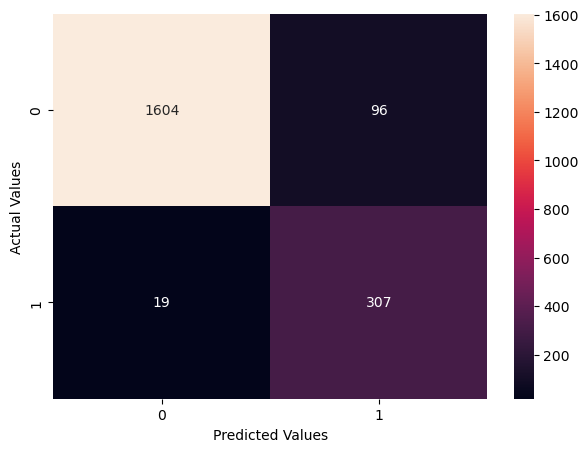

In [66]:
# Confusion matrix for oversampled train data
cm = confusion_matrix(y_test, pred_test)
plt.figure(figsize=(7, 5))
sns.heatmap(cm, annot=True, fmt="g")
plt.xlabel("Predicted Values")
plt.ylabel("Actual Values")

In [67]:
print (pd.DataFrame(un_models["XGBoost"].feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))


                                     Imp
Total_Trans_Ct                  0.205129
Total_Relationship_Count        0.081976
Total_Revolving_Bal             0.072384
Total_Ct_Chng_Q4_Q1             0.071466
Total_Trans_Amt                 0.061782
Total_Amt_Chng_Q4_Q1            0.041358
Avg_Utilization_Ratio           0.039628
Months_Inactive_12_mon          0.033025
Gender                          0.032499
Customer_Age                    0.030917
Dependent_count                 0.028519
Credit_Limit                    0.027985
Contacts_Count_12_mon           0.027254
Avg_Open_To_Buy                 0.026092
Education_Level_Post-Graduate   0.023429
Income_Category_Less than $40K  0.022741
Months_on_book                  0.020319
Income_Category_$80K - $120K    0.020170
Marital_Status_Married          0.018878
Marital_Status_Single           0.017504
Education_Level_High School     0.017425
Education_Level_Uneducated      0.017035
Income_Category_$60K - $80K     0.016039
Education_Level_

In [68]:
feature_names = X_train.columns

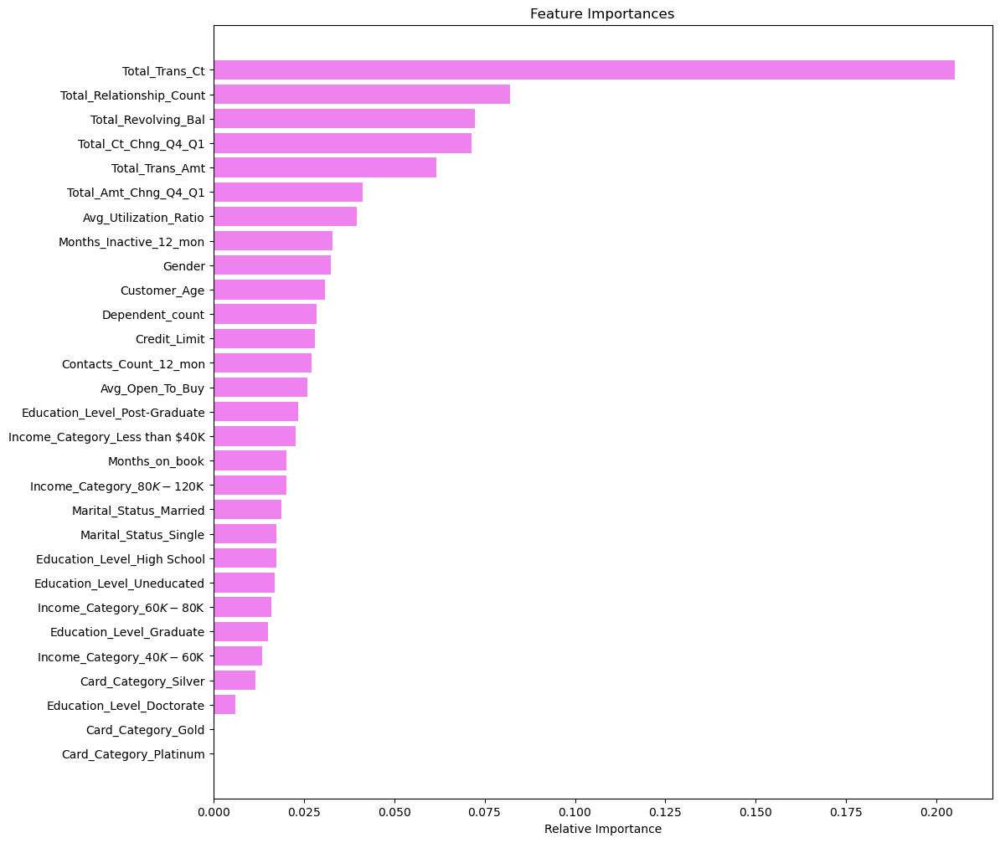

In [69]:
importances = un_models["XGBoost"].feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# Business Insights and Conclusions

I've built a predictive model that can help the company identify customers who are at risk of terminating their credit card services with the bank.  The model, with its feature importance, can be used to identify behaviors that indicate a customer is moving toward terminating service and take the necessary steps to intervene.     

Attrition from credit card services are driven primarily by Total Transaction Count, Total Relationship Count, and Total Revolving Balance.

Total Transaction Count: Customers with more Total Transactions stay customes. This is a strong feature and one that should be the focus of the bank.  They should take steps to incentivize using the credit card, possibly with reward points or some other benefit.  

Total Relationship Count: Customers who have more products with the bank are the ones who stay at the bank.  Again, incentivizing the use of more products is a way to make customers stick to the bank.  

Total Revolving Balance: As might be expected, customers with a revolving balance stay at the bank. Closing a credit card with a balance is more difficult to do. The bank might think of ways to market smaller interest rates if customers agree to pay over several months.  This generates revenue at a reduce profit, but it helps keep customers with the bank.   

Card Category doesn't seem to have an impact on attrition - the cards could be how rewards are categorized and dispensed, but the kind of card does not appear to be helpful at keeping customers.

Marital Status, Income, and Education do NOT appear to be powerfully influential in determining customers who will depart the bank.    

Overall, the bank needs to focus on ways to increase card usage and overall product use at the bank.  Customers stay with banks where more and more services and transactions are occuring regularly.  

***